In [1]:
import sys
sys.path.append("./../")

import os
import cv2
from matplotlib import pyplot as plt

from uav_utils.display import get_img_annotations

In [2]:
IMAGE_LOCATIONS = "./../data/images/"
# All filenames
FILES = ["1_1.JPG", "1_2.JPG", "1_3.JPG", "2_1.JPG", "2_2.JPG", "2_3.JPG", 
         "2_4.JPG", "3_1.JPG", "3_2.JPG", "3_3.JPG", "3_4.JPG", "4_1.JPG"]

ANNOTATIONS_V1 = "damage"
ANNOTATIONS_V2 = "damagev2"

ALPHA = 0.5

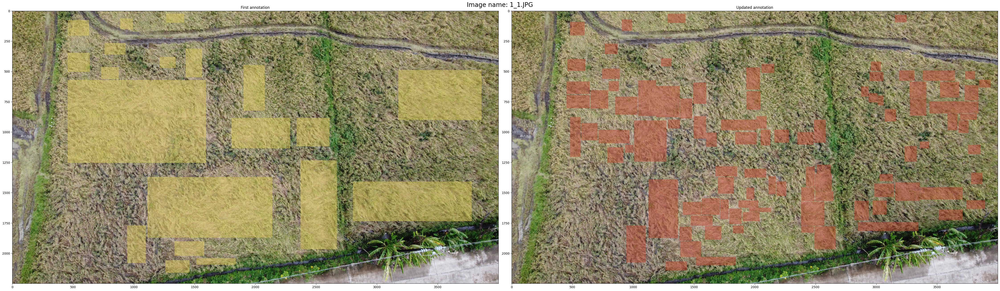

In [3]:
def display_both(img, boxes: list, fname: str):
    """
    Display both annotations side by side.
    """
    img1 = img.copy()
    img2 = img.copy()
    fig, axs = plt.subplots(1,2, figsize=(45, 13.15))
    
    for box in boxes:
        start = (int(float(box["@xtl"])), int(float(box["@ytl"])))
        end = (int(float(box["@xbr"])), int(float(box["@ybr"])))
        
        if box['@label'] == ANNOTATIONS_V1: 
            img1 = cv2.rectangle(img1, start, end, (90, 202, 219), -1) #199, 110, 90

        elif box['@label'] == ANNOTATIONS_V2:
            img2 = cv2.rectangle(img2, start, end, (49, 75, 189), -1) #189, 75, 49
    
    img1 = cv2.addWeighted(img, ALPHA, img1, 1 - ALPHA, 0)
    img2 = cv2.addWeighted(img, ALPHA, img2, 1 - ALPHA, 0)
    axs[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axs[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axs[0].set_title("First annotation")
    axs[1].set_title('Updated annotation')
    fig.suptitle(f"Image name: {fname}", fontsize=20)
    plt.tight_layout()
    plt.show()

annotation = get_img_annotations(os.path.join(IMAGE_LOCATIONS, "annotations_more_granular.xml"))

for img_fname in FILES:
    img_loc = os.path.join(IMAGE_LOCATIONS, img_fname)
    img = cv2.imread(img_loc)
    display_both(img, annotation[img_fname]["box"], img_fname)
    
    # Remove break to see all image
    break
    